In [1]:
import numpy as np
import matplotlib.pyplot as plt


from InputSimulator import make_input, make_pattern_presentation_array, copy_and_paste_jittered_pattern
from InputSimulator import triple_input_runtime, remove_close_spikes, add_noise


In [2]:
def pprint(A, precision=2):
    A = np.around(A, decimals=precision)
    if A.ndim==1:
        print(A)
    else:
        w = max([len(str(s)) for s in A]) 
        print(u'\u250c'+u'\u2500'*w+u'\u2510') 
        for AA in A:
            print(' ', end='')
            print('[', end='')
            for i,AAA in enumerate(AA[:-1]):
                w1=max([len(str(s)) for s in A[:,i]])
                print(str(AAA) +' '*(w1-len(str(AAA))+1),end='') # str(AAA)
            w1=max([len(str(s)) for s in A[:,-1]])
            print(str(AA[-1])+' '*(w1-len(str(AA[-1]))),end='') # str(AA[-1])
            print(']')
        print(u'\u2514'+u'\u2500'*w+u'\u2518')

## Generating Input

In [3]:
tripling = False
is_continuous = True
runduration = 20 # [second]
dt = 0.001 # [second]
number_neurons = 2000
number_pat = 1000  # number of neurons that take part in the pattern presentation



# T = len(np.arange(dt, runduration, dt))

max_time_wo_spike = 0.05 # [second]
min_rate, max_rate = 0 , 90
max_change_speed = max_rate / max_time_wo_spike # 90/0.05 = 1800 (max_S in paper)
patternlength = 0.05 # [second]
# pattern_freq = 0.5
pattern_freq = 0.25


max_rate_add = 10
min_rate_add = 10
max_time_wo_spike_add = 1000
max_change_speed_add = 0

spike_del = 0
jitter_sd = 0

In [4]:
indices, times = make_input(min_rate, max_rate, max_time_wo_spike, max_change_speed, runduration, number_neurons, dt, is_continuous)
position_copypaste = make_pattern_presentation_array(runduration, patternlength, pattern_freq)

In [5]:
def plot_input(times, indices, params, times_pattern=None, indices_pattern=None, model= None,):
    start_time = params['start_time']
    end_time = params['end_time']
    start_index = params['start_index']
    end_index = params['end_index']

    sampletimes = times[(times < end_time) & (indices < end_index) & (times > start_time) & (indices > start_index)]
    sampleindices = indices[(times < end_time) & (indices < end_index) & (times > start_time) & (indices > start_index)]

    
    intervals = np.arange(start_time, end_time+0.01, 0.05)
    colors = ['#c6dbef', '#9ecae1', '#6baed6', '#4292c6', '#2171b5', '#08519c']
    num_colors_needed = len(intervals) - 1
    num_colors_available = len(colors)
    colors = [colors[i % num_colors_available] for i in range(num_colors_needed)]
    for i in range(len(intervals) - 1):
        plt.axvline(intervals[i+1])
        plt.axvspan(intervals[i], intervals[i + 1], facecolor=colors[i], alpha=0.7)
    plt.plot(sampletimes, sampleindices, '.k', alpha=0.6)
    if times_pattern is not None and indices_pattern is not None:
        sampletimespattern = times_pattern[(times_pattern < end_time) & (indices_pattern < end_index) & (times_pattern > start_time) & (indices_pattern > start_index)]
        sampleindicespattern = indices_pattern[(times_pattern < end_time) & (indices_pattern < end_index) & (times_pattern > start_time) & (indices_pattern > start_index)]
        plt.plot(sampletimespattern, sampleindicespattern, '.r', alpha=0.6)
    plt.show()

    if model != None:
        plt.plot(np.arange(0,1.001,0.001), model.potential_rec[000:])
        for x in np.arange(0,1, 0.05):
            plt.axvline(x, color='red', linestyle='--')
        plt.show()

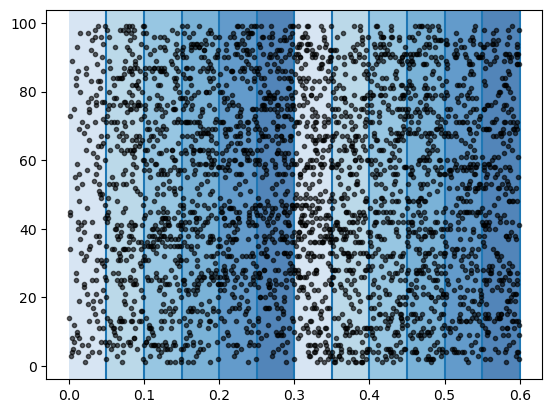

In [6]:
params = {'start_time' : 0.0,
        'end_time' : 0.6,
        'start_index' : 0,
        'end_index' : 100,}

plot_input(times, indices, params)

In [7]:
indices, times, (indices_pattern, times_pattern) = copy_and_paste_jittered_pattern(times, indices, position_copypaste, patternlength, jitter_sd, spike_del,number_pat)
indices_add, times_add = make_input(min_rate_add, max_rate_add, max_time_wo_spike_add,
                                max_change_speed_add, runduration, number_neurons, dt, is_continuous)
times, indices = add_noise(times, indices, times_add, indices_add)
if tripling and runduration > 300:
        times, indices = triple_input_runtime(times, indices)
        position_copypaste = np.concatenate((position_copypaste, position_copypaste, position_copypaste))
times, indices = remove_close_spikes(times, indices, dt)
indices = indices.astype(int)

# patneurons = range(0, number_pat)
# nonpatneurons = range(number_pat, number_neurons)

In [8]:
def get_dataset():
    spike_train = np.zeros((number_neurons, int(runduration/dt)))
    for time, index in zip(times, indices):
        time = int(time/dt)
        spike_train[index,time] = 1

    weight = np.ones((number_neurons,1)) * 0.475

    return spike_train, weight

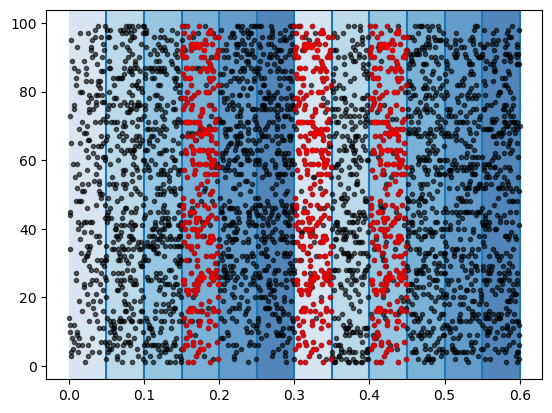

In [9]:
params = {'start_time' : 0.0,
        'end_time' : 0.6,
        'start_index' : 0,
        'end_index' : 100,}

plot_input(times, indices, params, times_pattern, indices_pattern)

### Edit BaseModel plots in the future 

In [10]:
# from numba import float64, int64, boolean, types
# from numba.experimental import jitclass


In [11]:
# class BaseModel:
#     def plot_kernel_(self, kernel, range, step_size):
#         r = np.arange(0,range,step_size)
#         if kernel == 'eta':
#             plt.plot(r/self.dt,self.eta_kernel(r), label=r'\eta kernel')
#             plt.plot(r/self.dt,self.eta_kernel(r), 'xr')
#             plt.axhline(0, linestyle='-', color='black')
#             plt.axhline(min(self.eta_kernel(r)), linestyle='-.', color='black', label='minimum vlaue')
#             plt.axhline(max(self.eta_kernel(r)), linestyle='-.', color='gray', label='maximum value')
#             plt.xlabel(r'$t - t_j$ (ms)')
#             plt.ylabel(r'$\eta (t - t_j)$ kernel')
#             plt.legend()
            
#         elif kernel == 'eps':
#             plt.plot(r/self.dt, self.eps_kernel(r), '--k', label=r'$\varepsilon$ kernel')
#             plt.plot(r/self.dt,self.eps_kernel(r), 'xr')
#             plt.axhline(0, linestyle='-.', color='black', label='minimum vlaue')
#             plt.axhline(1, linestyle='-.', color='gray', label='maximum value')
#             plt.xlabel(r'$t - t_j$ (ms)')
#             plt.ylabel(r'$\varepsilon (t - t_j)$ kernel')
#             plt.legend()
#         else:
#             raise ValueError(f"kernel must be either 'eta' or 'eps' ")
        
#     def show_epsilon_matrix_(self, size):
#         def print_epsilon_matrix(matrix):
#             max_lengths = max([max(len(str(cell)) for cell in row) for row in matrix])
            
#             column_widths = [max_lengths+2 for _ in range(matrix.shape[1])]
#             for row in matrix:
#                 print(" ".join(f"{cell:<{width}}" for cell, width in zip(row, column_widths)))
        
#         matrix = np.empty((2,size), dtype='U40')

#         for i in range(size):
#             matrix[0, i] = f'epsilon({size-i}ms)'
#             matrix[1, i] = self.eps_kernel((size-i)*self.dt)

#         print_epsilon_matrix(matrix)
    
#     def plot_membrane_potential_(self, spike_train):
#         plt.figure(figsize=(9,9))
#         plt.plot(np.arange(0,len(self.potential_rec),1), self.potential_rec)
#         # spikes = np.where(spike_train ==1)[1]
#         # for spk in spikes:
#         #     plt.axvline(spk, linestyle='-.', color='gray')
#         # if len(self.spike_rec)>0:
#         #     for spk in self.spike_rec:
#         #         plt.axvline(spk/self.dt, linestyle='--', color='gray')
#         plt.axhline(self.threshold, linestyle='dotted', color='orange')
#         plt.axhline(0, linestyle='dotted', color='k')
#         plt.xlabel('Time (ms)')
#         plt.ylabel('Potential (arbitraary units)')


In [64]:
# spec = [
#     ('A_pos', float64),
#     ('B', float64),
#     ('A_neg', float64),
#     ('tau_pos', float64),
#     ('tau_neg', float64),
#     ('verbose', boolean),
# ]

# @jitclass(spec)
# class STDP:
#     def __init__(self, A_pos, B, tau_pos, tau_neg, verbose=False) -> None:
#         """_summary_

#         Args:
#             A_pos (_type_): _description_
#             B (_type_): _description_
#             tau_pos (_type_): _description_
#             tau_neg (_type_): _description_
#         """
#         ## the variables are all float numbers exept verbose which is boolean
#         self.A_pos = A_pos
#         self.B = B
#         self.A_neg = - B * self.A_pos
#         self.tau_pos = tau_pos
#         self.tau_neg = tau_neg
#         self.verbose = verbose

#     def plot_stdp_(self, range, stepsize):
#         r = np.arange(-range,range, stepsize)
#         l = len(r)
#         half = int(l/2)
#         dw = [self.ltp(val) if val<0 else self.ltd(val) for val in r ]
#         # de_neg = [self.ltd(val) if val<0 for val in r]
#         plt.plot(r[:half], dw[:half], '.r')
#         plt.plot(r[half:], dw[half:], '.b')
#         plt.axhline(0, linestyle=':', color='black')
#         plt.axvline(0, linestyle=':', color='black')
#         plt.xlabel('T_pre - T_post (ms)')
#         plt.ylabel('dw')
    
#     def ltp(self, delta_t):
#         return self.A_pos * np.exp(delta_t/self.tau_pos)

#     def ltd(self, delta_t):
#         return self.A_neg * np.exp(-delta_t/self.tau_neg)


In [15]:
# spec = [
#     ('threshold', float64),
#     ('tau_m', float64),
#     ('tau_s', float64),
#     ('K1', float64),
#     ('K2', float64),
#     ('dt', float64),
#     ('tref', float64),
#     ('last_spike_time', float64),
#     ('last_spike_idx', int64),
#     ('spike_rec', types.Array(float64, 1, 'C')),
#     ('potential_rec', types.Array(float64, 1, 'C')),
#     ('ref_counter', int64),
#     ('w_sample', types.Array(float64, 2, 'C')),
#     ('A_pos', float64),
#     ('B', float64),
#     ('A_neg', float64),
#     ('tau_pos', float64),
#     ('tau_neg', float64),
# ]
# @jitclass(spec)
# class SRMContinuous():
#     def __init__(self, threshold, tau_m, tau_s, K1, K2, dt, tref,
#                  A_pos, B, tau_pos, tau_neg):
#         """_summary_

#         Args:
#             threshold (_type_): _description_
#             tau_m (_type_): _description_
#             tau_s (_type_): _description_
#             K1 (_type_): _description_
#             K2 (_type_): _description_
#             dt (_type_): _description_
#             tref (_type_): _description_
#             stdp (_type_): _description_
#             verbose (bool, optional): _description_. Defaults to False.
#         """
#         self.threshold = threshold
#         self.tau_m = tau_m
#         self.tau_s = tau_s
#         self.K1 = K1
#         self.K2 = K2
#         self.dt = dt
#         self.tref = tref
#         # self.stdp = stdp
#         # self.verbose = verbose

#         self.A_pos= A_pos
#         self.B=B
#         self.tau_pos=tau_pos
#         self.tau_neg=tau_neg,

#         self.last_spike_time = -10e9 # t_i
#         self.last_spike_idx = 0
#         self.spike_rec = np.array([], dtype=float)
#         self.potential_rec = np.array([0], dtype=float)
#         self.ref_counter = 0

#         #####################
#         self.w_sample = None
#         #####################

#     def ltp(self, delta_t):
#         return self.A_pos * np.exp(delta_t/self.tau_pos)

#     def ltd(self, delta_t):
#         return self.A_neg * np.exp(-delta_t/self.tau_neg)
    
#     def eps_kernel(self, s):
#         """"
#         s = t - t_j 
#         time difference between thre current time and spike time of presynaptic neuron (t_j)
#         K is chosen such that the maximum value of epsilon kernel will be 1, based on the tau_m and tau_s.
#         """
#         s_max = (self.tau_m * self.tau_s) / (self.tau_s - self.tau_m) * np.log(self.tau_s / self.tau_m)
#         max_val = (np.exp(-s_max/self.tau_m) - np.exp(-s_max/self.tau_s))
#         self.K = 1 / max_val
#         return self.K * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
    
#     def eta_kernel(self, s):
#         """
#         s = t - t_i
#         """
#         positive_pulse = self.K1 * np.exp(-s/self.tau_m)
#         negative_spike_afterpotential = self.K2 * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
#         return self.threshold * (positive_pulse - negative_spike_afterpotential)

#     def reset_neuron(self):
#         self.last_spike_time = -10e9 # t_i
#         self.last_spike_idx = 0 # index corresponding to t_i in times 
#         self.spike_rec = np.array([], dtype=float)
#         self.potential_rec = np.array([0], dtype=float)
#         self.ref_counter = 0
#         pass

#     def get_potential(self, times, indices, weight, idx):
#         start_window = self.last_spike_idx
#         end_window = idx + 1
#         window = times[start_window:end_window] # [0.0005 second]
#         afferent_number = indices[start_window:end_window] # [330]
#         next_input_time = times[end_window]
#         w = weight[afferent_number]
#         eps = self.eps_kernel(next_input_time - window)
#         eps = eps * w
#         eps = np.sum(eps)
#         if start_window > 0: 
#             eta = self.eta_kernel(next_input_time - self.last_spike_time)
#         else:
#             eta = np.zeros(1)
        
#         # if self.verbose:
#         #     print(window)
#         #     print(afferent_number)
#         #     print(next_input_time)
#         #     print(eps)
#         #     print(eta)
        
#         potential = eps + eta 
#         return potential
    
#     def do_ltp(self, times, indices, weight, idx):
#         # TODO: create a get_window_afferet_number method to reduce duplication
#         ######## not same code 
#         start_window = self.last_spike_idx
#         # TODO: I think it should be idx (not idx+1). 
#         end_window = idx
#         # end_window = idx + 1
#         window = times[start_window:end_window] # [0.0005 second]
#         afferent_number = indices[start_window:end_window]
#         ####### not same code

#         t_i = window
#         t_j = times[idx]

#         dw = self.ltp(t_j - t_i)
#         weight[afferent_number] += dw

#         return weight
    
#     def do_ltd(self, indices, weight, idx):
#         t_i = self.last_spike_time
#         t = times[idx]
#         dw = self.ltd(t - t_i)
#         afferent_number = indices[idx]
#         weight[afferent_number] += dw
#         return weight



#     def run(self, times, indices, weight): 
#         total_length = len(times)
#         # Calculate 5% of the total length
#         percent_interval = total_length // 20

#         # if self.w_sample is None:
#             ### TODO: Turn 0.475 to a variable
#             # self.w_sample = np.ones((10,total_length)) * 0.475

#         for idx in range(total_length):
            
            
#             if self.ref_counter > 0 :
#                 self.ref_counter -= 1
#             elif self.potential_rec[-1] > self.threshold:
#                 ##### STDP LTP Rule #####
#                 weight = self.do_ltp(times, indices, weight, idx)
#                 id_tmp = weight[:] > 1
#                 weight[id_tmp] = 1
                
#                 ### Spike ###
#                 ## TODO: add this and replace times[idx] if repeated a lot!
#                 ## TODO: define current_t right after for loop.
#                 # current_t = times[idx] 
#                 self.spike_rec = np.append(self.spike_rec, times[idx])
#                 self.last_spike_time = times[idx]
#                 self.last_spike_idx = idx
#                 self.ref_counter = self.tref/self.dt
#                 # TODO: maybe replace the line below instead
#                 # self.potential_rec[-1] = self.eta_kernel(0)
#                 self.potential_rec[-1] = self.eta_kernel(times[idx] - self.last_spike_time)
                

#             ## get membrane potential 
#             potential = self.get_potential(times, indices, weight, idx)
#             self.potential_rec = np.append(self.potential_rec, potential)

#             ##### STDP LTD Rule #####
#             weight = self.do_ltd(indices, weight, idx)
#             id_tmp = weight[:] < 0
#             weight[id_tmp] = 0

            
            
#             # if idx % percent_interval == 0:
#             #     percent_done = (idx / total_length) * 100
#             #     print(f"{percent_done:.0f}% of iterations done.")


#             # self.w_sample[:,idx] = weight[:10]

#         return weight        

In [10]:
# spec = [
#     ('threshold', float64),
#     ('tau_m', float64),
#     ('tau_s', float64),
#     ('K1', float64),
#     ('K2', float64),
#     ('dt', float64),
#     ('tref', float64),
#     ('last_spike_time', float64),
#     ('last_spike_idx', int64),
#     ('spike_rec', types.Array(float64, 1, 'C')),
#     ('potential_rec', types.Array(float64, 1, 'C')),
#     ('ref_counter', int64),
#     ('w_sample', types.Array(float64, 2, 'C')),
#     ('A_pos', float64),
#     ('B', float64),
#     ('A_neg', float64),
#     ('tau_pos', float64),
#     ('tau_neg', float64),
# ]
# @jitclass(spec)
# class SRMContinuous():
#     def __init__(self, threshold, tau_m, tau_s, K1, K2, dt, tref,A_pos, B, tau_pos, tau_neg):
#         self.threshold = threshold
#         self.tau_m = tau_m
#         self.tau_s = tau_s
#         self.K1 = K1
#         self.K2 = K2
#         self.dt = dt
#         self.tref = tref
#         self.A_pos= A_pos
#         self.B=B
#         self.tau_pos=tau_pos
#         self.tau_neg=tau_neg,
#         self.last_spike_time = -10e9 # t_i
#         self.last_spike_idx = 0
#         self.spike_rec = np.array([], dtype=float)
#         self.potential_rec = np.array([0], dtype=float)
#         self.ref_counter = 0
#     def ltp(self, delta_t):
#         return self.A_pos * np.exp(delta_t/self.tau_pos)

#     def ltd(self, delta_t):
#         return self.A_neg * np.exp(-delta_t/self.tau_neg)
    
#     def eps_kernel(self, s):
#         s_max = (self.tau_m * self.tau_s) / (self.tau_s - self.tau_m) * np.log(self.tau_s / self.tau_m)
#         max_val = (np.exp(-s_max/self.tau_m) - np.exp(-s_max/self.tau_s))
#         self.K = 1 / max_val
#         return self.K * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
    
#     def eta_kernel(self, s):
#         positive_pulse = self.K1 * np.exp(-s/self.tau_m)
#         negative_spike_afterpotential = self.K2 * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
#         return self.threshold * (positive_pulse - negative_spike_afterpotential)

#     def reset_neuron(self):
#         self.last_spike_time = -10e9 # t_i
#         self.last_spike_idx = 0 # index corresponding to t_i in times 
#         self.spike_rec = np.array([], dtype=float)
#         self.potential_rec = np.array([0], dtype=float)
#         self.ref_counter = 0
#         pass

#     def get_potential(self, times, indices, weight, idx):
#         start_window = self.last_spike_idx
#         end_window = idx + 1
#         window = times[start_window:end_window] # [0.0005 second]
#         afferent_number = indices[start_window:end_window] # [330]
#         next_input_time = times[end_window]
#         w = weight[afferent_number]
#         eps = self.eps_kernel(next_input_time - window)
#         eps = eps * w
#         eps = np.sum(eps)
#         if start_window > 0: 
#             eta = self.eta_kernel(next_input_time - self.last_spike_time)
#         else:
#             eta = np.zeros(1)        
#         potential = eps + eta 
#         return potential
    
#     def do_ltp(self, times, indices, weight, idx):
#         start_window = self.last_spike_idx
#         end_window = idx
#         window = times[start_window:end_window] # [0.0005 second]
#         afferent_number = indices[start_window:end_window]
#         t_i = window
#         t_j = times[idx]
#         dw = self.ltp(t_j - t_i)
#         weight[afferent_number] += dw
#         return weight
    
#     def do_ltd(self, indices, weight, idx):
#         t_i = self.last_spike_time
#         t = times[idx]
#         dw = self.ltd(t - t_i)
#         afferent_number = indices[idx]
#         weight[afferent_number] += dw
#         return weight

#     def run(self, times, indices, weight): 
#         total_length = len(times)
#         for idx in range(total_length):
#             if self.ref_counter > 0 :
#                 self.ref_counter -= 1
#             elif self.potential_rec[-1] > self.threshold:
#                 weight = self.do_ltp(times, indices, weight, idx)
#                 id_tmp = weight[:] > 1
#                 weight[id_tmp] = 1
#                 self.spike_rec = np.append(self.spike_rec, times[idx])
#                 self.last_spike_time = times[idx]
#                 self.last_spike_idx = idx
#                 self.ref_counter = self.tref/self.dt
#                 self.potential_rec[-1] = self.eta_kernel(times[idx] - self.last_spike_time)
                
#             potential = self.get_potential(times, indices, weight, idx)
#             self.potential_rec = np.append(self.potential_rec, potential)

#             weight = self.do_ltd(indices, weight, idx)
#             id_tmp = weight[:] < 0
#             weight[id_tmp] = 0

#         return weight        

## Model

In [12]:
from numba import types, typed
# from numba.experimental import jitclass

# spec = [
#     ('threshold', types.float64),
#     ('tau_m', types.float64),
#     ('tau_s', types.float64),
#     ('K1', types.float64),
#     ('K2', types.float64),
#     ('dt', types.float64),
#     ('tref', types.float64),
#     ('last_spike_time', types.float64),
#     ('last_spike_idx', types.int64),
#     ('spike_rec', types.ListType(types.float64)),
#     ('potential_rec', types.ListType(types.float64)),
#     ('ref_counter', types.int64),
#     ('A_pos', types.float64),
#     ('B', types.float64),
#     ('A_neg', types.float64),
#     ('tau_pos', types.float64),
#     ('tau_neg', types.float64),
# ]

# @jitclass(spec)
class SRMContinuous():
    def __init__(self, threshold, tau_m, tau_s, K1, K2, dt, tref,A_pos, B, tau_pos, tau_neg):
        self.threshold = threshold
        self.tau_m = tau_m
        self.tau_s = tau_s
        self.K1 = K1
        self.K2 = K2
        self.dt = dt
        self.tref = tref
        self.A_pos= A_pos
        self.B=B
        self.tau_pos=tau_pos
        self.tau_neg=tau_neg
        self.A_neg = - B * self.A_pos
        self.last_spike_time = -10e9 # t_i
        self.last_spike_idx = 0
        self.spike_rec = typed.List.empty_list(types.float64)
        self.potential_rec = typed.List.empty_list(types.float64)
        self.ref_counter = 0
        
    def ltp(self, delta_t):
        return self.A_pos * np.exp(delta_t/self.tau_pos)

    def ltd(self, delta_t):
        return self.A_neg * np.exp(-delta_t/self.tau_neg)
    
    def eps_kernel(self, s):
        s_max = (self.tau_m * self.tau_s) / (self.tau_s - self.tau_m) * np.log(self.tau_s / self.tau_m)
        max_val = (np.exp(-s_max/self.tau_m) - np.exp(-s_max/self.tau_s))
        K = 1 / max_val
        return K * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
    
    def eta_kernel(self, s):
        positive_pulse = self.K1 * np.exp(-s/self.tau_m)
        negative_spike_afterpotential = self.K2 * (np.exp(-s/self.tau_m) - np.exp(-s/self.tau_s))
        return self.threshold * (positive_pulse - negative_spike_afterpotential)

    def reset_neuron(self):
        self.last_spike_time = -10e9 # t_i
        self.last_spike_idx = 0 # index corresponding to t_i in times 
        self.spike_rec = typed.List.empty_list(types.float64)
        self.potential_rec = typed.List.empty_list(types.float64)
        self.ref_counter = 0

    def get_potential(self, times, indices, weight, idx):
        start_window = self.last_spike_idx
        end_window = idx + 1
        window = times[start_window:end_window] # [0.0005 second]
        afferent_number = indices[start_window:end_window] # [330]
        next_input_time = times[end_window]
        w = weight[afferent_number]
        eps = self.eps_kernel(next_input_time - window)
        eps = eps * w
        # print(f'window (current time second):')
        # pprint(window, precision=4)
        # print(f'eps(next_input_time - window) = eps({next_input_time}- window) ')
        # print(f'eps matrix:')
        # pprint(eps)
        eps = np.sum(eps)
        # if start_window > 0: 
        eta = self.eta_kernel(next_input_time - self.last_spike_time)
        # else:
        #     eta = self.eta_kernel(next_input_time - self.last_spike_time)
        
        potential = eps + eta
        print(f'eta(next_input_time - last_spike_time) = eta({next_input_time} - {self.last_spike_time})')
        print(f'eta:\n{eta}')
        # print(f'potential for {idx+1}\n{potential}')
        # print('*****************************\n')
        return potential
    
    def do_ltp(self, times, indices, weight, idx):
        start_window = self.last_spike_idx
        end_window = idx
        # print(f'start_window = {start_window}')
        # print(f'end_window = {end_window}')
        window = times[start_window:end_window] # [0.0005 second]
        afferent_number = indices[start_window:end_window]
        t_j = window
        t_i = times[idx]
        dw = self.ltp(t_j - t_i)
        # print('LTP (t_j - t_i)')
        # print(f'LTP window (t_j):')
        pprint(window)
        # print(f't_i = {t_i}')
        # print('doing LTP')
        # print(f'dw = {dw}')
        # print('**************************************\n')
        weight[afferent_number] += dw
        return weight
    
    def do_ltd(self, indices, weight, idx):
        t_i = self.last_spike_time
        t = times[idx]
        dw = self.ltd(t - t_i)
        afferent_number = indices[idx]
        weight[afferent_number] += dw
        return weight

    def run(self, times, indices, weight): 
        total_length = len(times)
        got_to_zero = True
        for idx in range(total_length):
            if idx+1 == total_length:
                continue
            if self.ref_counter > 0 :
                self.ref_counter -= 1

            elif self.potential_rec and self.potential_rec[-1] > self.threshold and got_to_zero:
                weight = self.do_ltp(times, indices, weight, idx)
                id_tmp = weight[:] > 1
                weight[id_tmp] = 1
                self.spike_rec.append(times[idx])
                self.last_spike_time = times[idx]
                self.last_spike_idx = idx
                self.ref_counter = self.tref/self.dt
                self.potential_rec[-1] = self.eta_kernel(0)

                got_to_zero = False
                
                
            potential = self.get_potential(times, indices, weight, idx)
            if potential < 0 :
                got_to_zero = True
            self.potential_rec.append(potential)
            print(f'potential for idx {idx+1} = {potential}')
            print('end of loop\n**************************\n')

            # weight = self.do_ltd(indices, weight, idx)
            # id_tmp = weight[:] < 0
            # weight[id_tmp] = 0

        return weight 

## Experiments

In [13]:
A_pos= 0.03125
B=0.85
tau_pos=0.0168
tau_neg=0.0337
A_neg = -B*A_pos
print('B factor is:')
print(-A_neg*tau_neg/(A_pos*tau_pos))

B factor is:
1.7050595238095239


In [14]:
threshold = 500
tau_m = 0.010
tau_s = 0.0025
K1 = 2
K2 = 4
dt = 0.001
# window_size = np.inf
tref = 0.001
verbose = False

model = SRMContinuous(threshold=threshold, tau_m=tau_m, tau_s=tau_s, K1=K1, K2=K2,
            dt=dt, tref=tref,
            A_pos= A_pos, B=B, tau_pos=tau_pos, tau_neg=tau_neg,)

#### add initial_weight_value to the other files (SRM.ipynb) 
number_neurons = 2000
initial_weight_value = 0.475
weight = np.ones(number_neurons) * initial_weight_value

In [15]:
sample_num = 50000
times_sample = times[:sample_num] 
indices_sample = indices[:sample_num]

In [16]:
model.reset_neuron()
model.run(times_sample, indices_sample, weight)

eta(next_input_time - last_spike_time) = eta(1.6476686983948755e-05 - -10000000000.0)
eta:
0.0
potential for idx 1 = 0.004793318026609741
end of loop
**************************

eta(next_input_time - last_spike_time) = eta(0.00010067152508259978 - -10000000000.0)
eta:
0.0
potential for idx 2 = 0.054325788807335365
end of loop
**************************

eta(next_input_time - last_spike_time) = eta(0.00010996981877215307 - -10000000000.0)
eta:
0.0
potential for idx 3 = 0.062466506883519984
end of loop
**************************

eta(next_input_time - last_spike_time) = eta(0.00012082289281388611 - -10000000000.0)
eta:
0.0
potential for idx 4 = 0.07518491161968605
end of loop
**************************

eta(next_input_time - last_spike_time) = eta(0.0001492115407552828 - -10000000000.0)
eta:
0.0
potential for idx 5 = 0.1166280590515218
end of loop
**************************

eta(next_input_time - last_spike_time) = eta(0.00016132797890011316 - -10000000000.0)
eta:
0.0
potential for idx 6

array([0.93545095, 0.75167921, 0.68743336, ..., 0.86849793, 0.74193522,
       0.78048708])

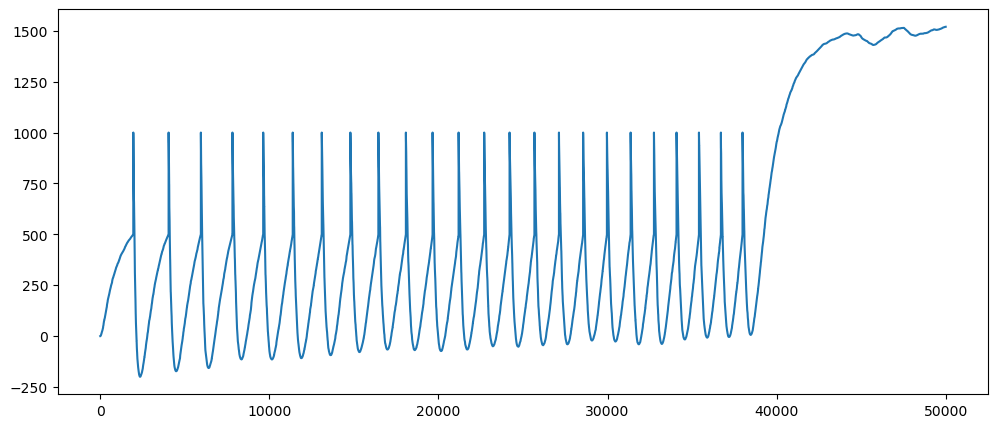

In [56]:
start_time = 0
end_time = sample_num - 1

plt.figure(figsize=(12,5))
plt.plot(model.potential_rec[start_time:end_time])


ValueError: x and y must have same first dimension, but have shapes (20000,) and (8,)

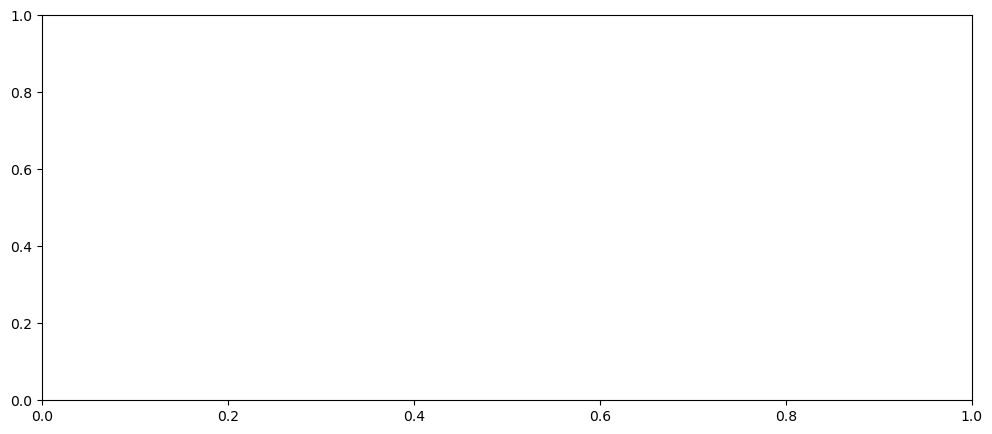

In [44]:
start_time = 0
end_time = 20

plt.figure(figsize=(12,5))
plt.plot(np.arange(start_time,end_time,dt), model.potential_rec[int(start_time/dt):int(end_time/dt)])

position_copypaste[int(start_time/patternlength) : int(end_time/patternlength)]
intervals = np.arange(start_time,end_time+patternlength,patternlength)
for i in range(0, len(intervals)-1, 2):
    plt.axvspan(intervals[i], intervals[i + 1], facecolor='gray', alpha=0.7)

# for x in np.arange(start_time,end_time, 0.05):
#     plt.axvline(x, color='red', linestyle='--', alpha=0.3)
plt.show()

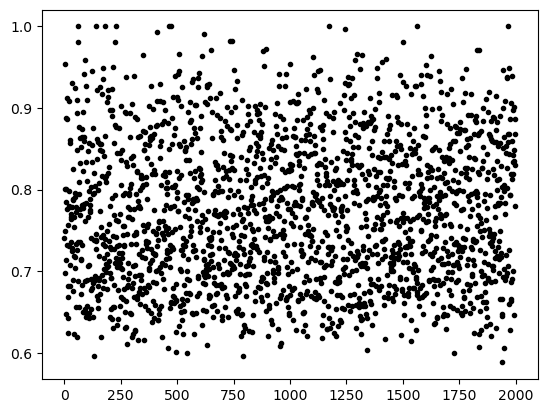

In [57]:
plt.plot(np.arange(len(weight)), weight, '.k')
plt.show()